# Benchmark 

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import os
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
from scipy import sparse

# from matplotlib import font_manager, rcParams
# custom_rc = {
#     'font.family': 'DejaVu Sans',
# }

# mpl.rcParams['svg.fonttype'] = 'none'
# mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "dkd_Wilson"
file_name = "dkd_Wilson"
file_suffix = time.strftime('%b%d-%H%M')

save_dir = Path(f"../save/{proj_name}-{file_suffix}")
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)

seed = 0
ccd.ul.set_seed(seed)

In [4]:
# load the data
adata = sc.read_h5ad(data_dir / f"{file_name}.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'default_embedding', 'schema_reference', 'schema_version', 'title'


### preprocessing

In [6]:
# ---------------------- Config ----------------------
MIN_GENES = 300
MIN_CELLS_PER_GENE = 5
N_TOP_HVG = 5000
N_PCS = 300

# ---------------------- Restart from Raw ----------------------
adata = adata.raw.to_adata()
print(f"✅ Restarted from raw: {adata.shape}")

# ---------------------- Add 'counts' Layer ----------------------
# Ensure integer counts and store them
if not np.issubdtype(adata.X.dtype, np.integer):
    adata.X = adata.X.astype("int32")
adata.layers["counts"] = adata.X.copy()

# ---------------------- QC Metrics ----------------------
sc.pp.calculate_qc_metrics(adata, inplace=True)

✅ Restarted from raw: (39176, 36398)


In [7]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'


In [14]:
adata.obs[batch_key].value_counts().to_dict()

{32: 6466,
 49: 5196,
 62: 4359,
 54: 4245,
 71: 4226,
 58: 4196,
 30: 3961,
 46: 3948,
 59: 3942,
 16: 3892,
 70: 3891,
 57: 3856,
 84: 3851,
 47: 3820,
 40: 3819,
 42: 3786,
 28: 3759,
 44: 3738,
 43: 3699,
 12: 3684,
 76: 3573,
 15: 3545,
 51: 3542,
 34: 3497,
 69: 3491,
 39: 3445,
 38: 3444,
 67: 3434,
 48: 3397,
 27: 3396,
 75: 3296,
 82: 3271,
 14: 3269,
 55: 3003,
 24: 2964,
 83: 2794,
 87: 2711,
 2: 2705,
 81: 2589,
 79: 2577,
 33: 2577,
 36: 2511,
 23: 2497,
 20: 2374,
 73: 2291,
 37: 2273,
 50: 2269,
 56: 2205,
 68: 2111,
 72: 2059,
 31: 2015,
 77: 1993,
 80: 1988,
 19: 1862,
 0: 1777,
 52: 1725,
 74: 1714,
 18: 1674,
 53: 1650,
 86: 1628,
 61: 1607,
 26: 1561,
 41: 1530,
 3: 1507,
 35: 1435,
 25: 1363,
 22: 1211,
 29: 1179,
 13: 1010,
 17: 964,
 78: 940,
 4: 892,
 10: 888,
 7: 713,
 85: 622,
 6: 574,
 45: 561,
 66: 545,
 65: 493,
 60: 439,
 11: 292,
 63: 242,
 64: 222,
 8: 196,
 92: 161,
 5: 145}

In [15]:
# ---------------------- Cell Filtering ----------------------
adata = adata[adata.obs.n_genes_by_counts > MIN_GENES, :]
adata.write(data_dir / f"{file_name}_preprocessed.h5ad")
adata.shape

(208459, 32839)

In [16]:
# ---------------------- Gene Filtering ----------------------
sc.pp.filter_genes(adata, min_cells=MIN_CELLS_PER_GENE)
adata.shape

(208459, 28025)

In [17]:
# ---------------------- Set Filtered Raw ----------------------
adata.raw = adata.copy()

# ---------------------- Normalize & Log Transform ----------------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# ---------------------- Highly Variable Genes ----------------------
sc.pp.highly_variable_genes(
    adata,
    flavor='seurat_v3',
    n_top_genes=N_TOP_HVG,
    subset=False
)

# ---------------------- PCA ----------------------
sc.tl.pca(
    adata,
    n_comps=N_PCS,
    svd_solver='arpack',
    use_highly_variable=True
)

# ---------------------- Subset to HVGs ----------------------
adata = adata[:, adata.var.highly_variable].copy()
adata.write(data_dir / f"{file_name}_preprocessed_HVG.h5ad")  # after HVG subsetting

print(f"✅ Preprocessing complete: {adata.shape}. 'counts' saved in layers and raw.")

✅ Preprocessing complete: (208459, 5000). 'counts' saved in layers and raw.


### evaluate preprocessing 

In [29]:
import numpy as np

zero_expression = np.array(adata.X.sum(axis=1)).flatten() == 0
n_zero_cells = np.sum(zero_expression)

print(f"❗ {n_zero_cells} cells have 0 expression in `adata.X`")


❗ 0 cells have 0 expression in `adata.X`


In [30]:
# import pandas as pd

batch_key = 'batch'  # or your actual batch column in adata.obs
for batch in adata.obs[batch_key].unique():
    sub = adata[adata.obs[batch_key] == batch]
    X = sub.X.toarray() if sparse.issparse(sub.X) else sub.X
    zero_var = np.sum(np.var(X, axis=0) == 0)
    print(f"{batch}: {zero_var} zero-variance genes")


73: 1682 zero-variance genes
74: 1869 zero-variance genes
75: 1580 zero-variance genes
76: 1464 zero-variance genes
77: 1598 zero-variance genes
78: 2614 zero-variance genes
79: 1752 zero-variance genes
80: 1646 zero-variance genes
81: 1667 zero-variance genes
82: 2374 zero-variance genes
83: 1687 zero-variance genes
84: 1457 zero-variance genes
0: 1498 zero-variance genes
1: 5000 zero-variance genes
2: 1335 zero-variance genes
3: 1498 zero-variance genes
4: 2062 zero-variance genes
5: 3082 zero-variance genes
6: 2233 zero-variance genes
7: 2373 zero-variance genes
8: 2871 zero-variance genes
9: 3441 zero-variance genes
10: 2090 zero-variance genes
11: 3134 zero-variance genes
12: 1186 zero-variance genes
13: 2441 zero-variance genes
14: 1301 zero-variance genes
15: 1121 zero-variance genes
16: 1079 zero-variance genes
17: 2384 zero-variance genes
18: 1404 zero-variance genes
19: 1389 zero-variance genes
20: 1476 zero-variance genes
21: 3439 zero-variance genes
22: 1799 zero-variance g

In [31]:
min_val = adata.X.min()
print(f"🔍 Minimum value in adata.X: {min_val}")

max_val = adata.X.max()
print(f"🔍 Maximum value in adata.X: {max_val}")

if min_val < 0:
    print("⚠️ adata.X is scaled — contains negative values.")
else:
    print("✅ adata.X is non-negative — likely log1p transformed, not scaled.")


🔍 Minimum value in adata.X: 0.0
🔍 Maximum value in adata.X: 8.332630157470703
✅ adata.X is non-negative — likely log1p transformed, not scaled.


In [32]:
counts = adata.layers["counts"]
if counts is None:
    print("❌ adata.layers['counts'] does not exist.")
else:
    # Check min and integer-ness
    if sparse.issparse(counts):
        counts = counts.data  # only nonzero values
    else:
        counts = counts.flatten()

    min_val = counts.min()
    is_integer = np.allclose(counts, np.round(counts))

    print(f"🔍 counts layer — min: {min_val}, integer-like: {is_integer}")
    if min_val < 0:
        print("❌ counts layer contains negative values!")
    elif not is_integer:
        print("❌ counts layer contains non-integer values!")
    else:
        print("✅ counts layer looks valid: non-negative integers.")


🔍 counts layer — min: 1, integer-like: True
✅ counts layer looks valid: non-negative integers.


In [33]:
adata

AnnData object with n_obs × n_vars = 208812 × 5000
    obs: 'Sample ID_prep', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'n_genes', 'fpr', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sample ID', 'donor_id', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'scrublet', 'scrublet_score', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'channel', 'developme

### run integration methods

In [18]:
adata = sc.read_h5ad(data_dir / f"{file_name}_preprocessed_HVG.h5ad")

In [19]:
adata

AnnData object with n_obs × n_vars = 208459 × 5000
    obs: 'Sample ID_prep', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'n_genes', 'fpr', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sample ID', 'donor_id', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'scrublet', 'scrublet_score', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'channel', 'developme

In [23]:
import subprocess, json
methods = ["scvi", "harmony", "scanorama", "unintegrated", "concord_hcl", "contrastive", "liger"]

# concord_args = {
#     "encoder_dims": [512, 256],
#     "beta": 0.1,
#     "n_epochs": 10
# }

output_dir = '../jobs'
device = 'auto'
conda_env = 'concord_env'
batch_key = batch_key  # Use the same batch key as in the notebook  
state_key = 'cell_type'
latent_dim = '50'  # Adjust as needed, but should match the encoder_dims in concord_args

mode = 'local'

subprocess.run([
    "python", "./generate_py_sh_jobs.py",
    "--proj_name", proj_name,
    "--adata_filename", f"{file_name}_preprocessed.h5ad",
    "--methods", *methods,
    "--batch_key", batch_key,
    "--state_key", state_key,
    "--latent_dim", latent_dim,
    "--output_dir", output_dir,
    "--device", device,
    "--conda_env", conda_env,
    "--runtime", "02:00:00",
    "--mode", mode,
    # "--concord_kwargs", json.dumps(concord_args)
], check=True)

✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_scvi.py
✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_scvi.sh

✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_harmony.py
✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_harmony.sh

✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_scanorama.py
✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_scanorama.sh

✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_unintegrated.py
✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_unintegrated.sh

✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_concord_hcl.py
✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_concord_hcl.sh

✅ Generated: benchmark_cross_tissue_Eraslan/benchmark_cross_tissue_Eraslan_contrastive.py
✅ Generated: benchmark_cross_

CompletedProcess(args=['python', './generate_py_sh_jobs.py', '--proj_name', 'cross_tissue_Eraslan', '--adata_filename', 'cross_tissue_Eraslan_preprocessed.h5ad', '--methods', 'scvi', 'harmony', 'scanorama', 'unintegrated', 'concord_hcl', 'contrastive', 'liger', '--batch_key', 'donor_id', '--state_key', 'cell_type', '--latent_dim', '50', '--output_dir', '../jobs', '--device', 'auto', '--conda_env', 'concord_env', '--runtime', '02:00:00', '--mode', 'local'], returncode=0)

In [24]:
proj_folder = Path(output_dir) / f"benchmark_{proj_name}"
proj_folder.mkdir(parents=True, exist_ok=True)  # defensive

submit_all = proj_folder / f"submit_all_{proj_name}.sh"

with submit_all.open("w") as f:
    f.write("#!/bin/bash\n")
    f.write("# Auto-generated — sequentially runs every benchmark Python file\n")
    f.write('cd "$(dirname "$0")"\n\n')

    f.write("source ~/.bashrc\n")
    f.write("conda activate concord_env\n\n")    
    f.write("timestamp=$(date +'%m%d-%H%M')\n\n")

    # Set the Python executable to use
    f.write('py_exec="${PYTHON_EXEC:-python}"\n\n')

    for py_file in sorted(proj_folder.glob(f"benchmark_{proj_name}_*.py")):
        base = py_file.stem
        f.write(f"echo '🔄 Running: {py_file.name} (log: {base}_${{timestamp}}.log)'\n")
        f.write(f"${{py_exec}} {py_file.name} > {base}_${{timestamp}}.log 2>&1\n")
        f.write("echo '✅ Done.'\n\n")

submit_all.chmod(0o755)
print(f"📌  Next step: Run “{submit_all}” to execute all batch integration methods sequentially.")

📌  Next step: Run “../jobs/benchmark_cross_tissue_Eraslan/submit_all_cross_tissue_Eraslan.sh” to execute all batch integration methods sequentially.


In [25]:
# Run “../jobs/benchmark_cross_tissue_Eraslan/submit_all_cross_tissue_Eraslan.sh”
!bash ../jobs/benchmark_cross_tissue_Eraslan/submit_all_cross_tissue_Eraslan.sh

🔄 Running: benchmark_cross_tissue_Eraslan_concord_hcl.py (log: benchmark_cross_tissue_Eraslan_concord_hcl_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_cross_tissue_Eraslan_contrastive.py (log: benchmark_cross_tissue_Eraslan_contrastive_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_cross_tissue_Eraslan_harmony.py (log: benchmark_cross_tissue_Eraslan_harmony_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_cross_tissue_Eraslan_liger.py (log: benchmark_cross_tissue_Eraslan_liger_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_cross_tissue_Eraslan_scanorama.py (log: benchmark_cross_tissue_Eraslan_scanorama_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_cross_tissue_Eraslan_scvi.py (log: benchmark_cross_tissue_Eraslan_scvi_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_cross_tissue_Eraslan_unintegrated.py (log: benchmark_cross_tissue_Eraslan_unintegrated_${timestamp}.log)
✅ Done.


In [ ]:
# !cd ../jobs/benchmark_cross_tissue_Eraslan && python benchmark_cross_tissue_Eraslan_concord_knn.py

In [ ]:
# map the obsm back to the adata 
# for each method, uses the most recent run (based on timestamp)
# methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]

from benchmark_utils import add_embeddings

adata = add_embeddings(adata, proj_name=proj_name, methods=methods)



✅ obsm['scvi'] loaded
✅ obsm['harmony'] loaded
✅ obsm['scanorama'] loaded
✅ obsm['unintegrated'] loaded
✅ obsm['concord_hcl'] loaded
✅ obsm['contrastive'] loaded


In [16]:
adata

AnnData object with n_obs × n_vars = 208812 × 5000
    obs: 'Sample ID_prep', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'n_genes', 'fpr', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sample ID', 'donor_id', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'scrublet', 'scrublet_score', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'channel', 'developme

In [ ]:
for method in methods:
    if f"{method}_UMAP" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 2D UMAP for {method}...")
        ccd.ul.run_umap(adata, source_key=f"{method}", result_key=f"{method}_UMAP", n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP'] computed")
    if f"{method}_UMAP_3D" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP_3D'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 3D UMAP for {method}...")
        ccd.ul.run_umap(adata,source_key=f"{method}",result_key=f"{method}_UMAP_3D",n_components=3,  min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP_3D'] computed")

ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")
print(f"✅ Embeddings saved to {save_dir / f'obsm_{file_suffix}.h5'}")
final_path = data_dir / f"{file_name}_final.h5ad"
adata.write_h5ad(final_path)
print(f"✅ Final AnnData saved to: {final_path}")

Computing 2D UMAP for scvi...
Concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP']
✅ obsm['scvi_UMAP'] computed
Computing 2D UMAP for harmony...
Concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP']
✅ obsm['harmony_UMAP'] computed
Computing 2D UMAP for scanorama...
Concord - INFO - UMAP embedding stored in adata.obsm['scanorama_UMAP']
✅ obsm['scanorama_UMAP'] computed
Computing 2D UMAP for unintegrated...
Concord - INFO - UMAP embedding stored in adata.obsm['unintegrated_UMAP']
✅ obsm['unintegrated_UMAP'] computed
Computing 2D UMAP for concord_hcl...
Concord - INFO - UMAP embedding stored in adata.obsm['concord_hcl_UMAP']
✅ obsm['concord_hcl_UMAP'] computed
Computing 2D UMAP for contrastive...
Concord - INFO - UMAP embedding stored in adata.obsm['contrastive_UMAP']
✅ obsm['contrastive_UMAP'] computed
✅ Embeddings saved to ../save/cross_tissue_Eraslan-Jul01-0407/obsm_Jul01-0407.h5
✅ Final AnnData saved to: ../data/cross_tissue_Eraslan/cross_tissue_Eraslan_fin

In [19]:
adata

AnnData object with n_obs × n_vars = 208812 × 5000
    obs: 'Sample ID_prep', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'n_genes', 'fpr', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sample ID', 'donor_id', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'scrublet', 'scrublet_score', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'channel', 'developme

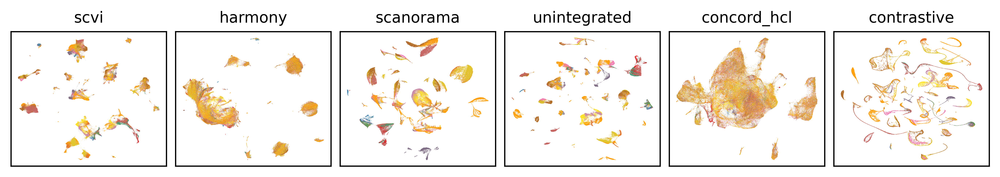

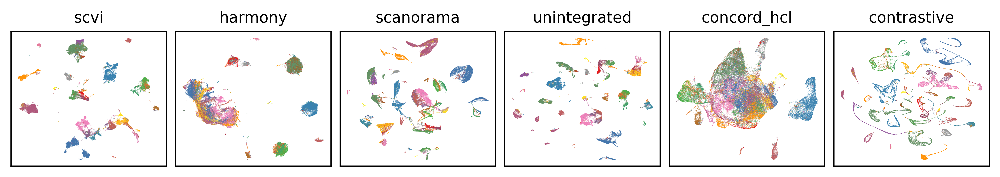

In [20]:
# plot everything
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = ['donor_id', 'cell_type']
basis_types = ['UMAP']

font_size=10
point_size=.1
alpha=0.8
ncols = len(show_keys)
figsize=(ncols * 1.5,1.5)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = {'donor_id': 'Set1', 
       'cell_type': 'Set1'}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=show_cols,
        basis_types=basis_types,
        pal=pal,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        save_dir=save_dir,
        file_suffix=file_suffix,
        dpi=600,
        save_format='svg'
    )


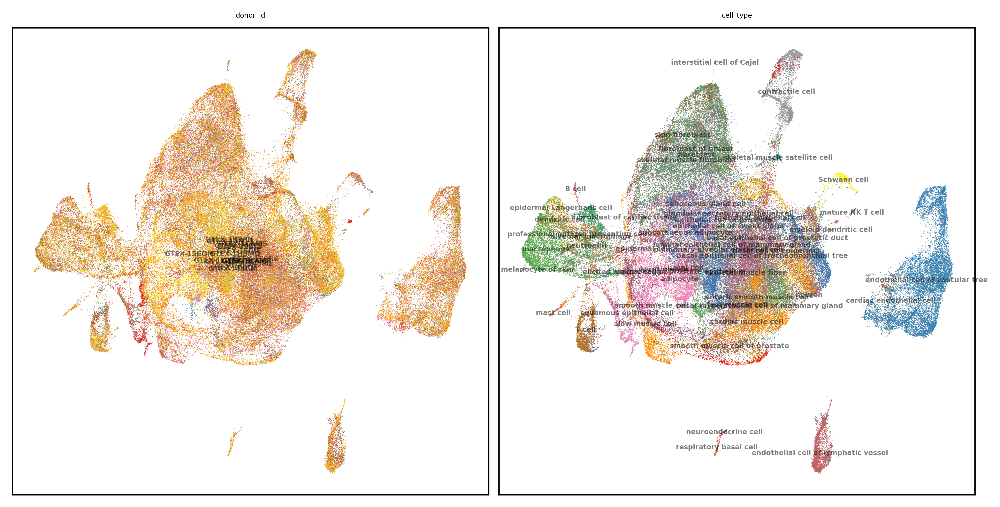

In [21]:
output_key = 'concord_hcl'
basis = output_key
show_basis = basis + '_UMAP'
show_cols = ['donor_id', 'cell_type']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(8,4), dpi=600, ncols=2, font_size=4, point_size=0.5, legend_loc='on data',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

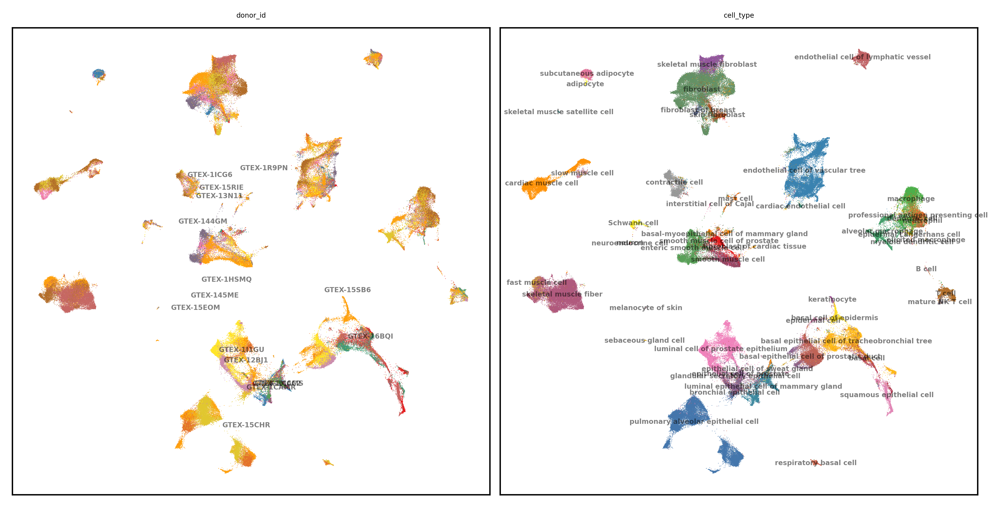

In [22]:
output_key = 'scvi'
basis = output_key
show_basis = basis + '_UMAP'
show_cols = ['donor_id', 'cell_type']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(8,4), dpi=600, ncols=2, font_size=4, point_size=0.5, legend_loc='on data',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

In [23]:
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='cel')
print(f"Saved viscello to {data_dir / f'cello_{proj_name}_{file_suffix}'}")

VisCello project created at ../data/cross_tissue_Eraslan/cello_cross_tissue_Eraslan_Jul01-0407
Saved viscello to ../data/cross_tissue_Eraslan/cello_cross_tissue_Eraslan_Jul01-0407


# Benchmarking

✅ Benchmark summary saved to: ../save/cross_tissue_Eraslan-Jul01-0407/benchmark_summary_Jul01-0407.tsv


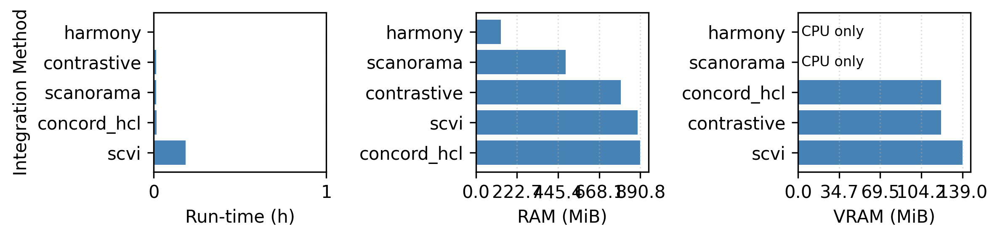

In [24]:
from benchmark_utils import collect_benchmark_logs
bench_df = collect_benchmark_logs("dkd_Wilson", methods)
# Save the benchmark results
bench_df.to_csv(save_dir / f"benchmark_summary_{file_suffix}.tsv", sep="\t", index=False)
print(f"✅ Benchmark summary saved to: {save_dir / f'benchmark_summary_{file_suffix}.tsv'}")
# Plot benchmark results
from benchmark_utils import plot_benchmark_performance
import matplotlib.pyplot as plt
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}
with plt.rc_context(rc=custom_rc):
    plot_benchmark_performance(bench_df, figsize=(8,2), dpi=300, save_path = save_dir / f"benchmark_plot_{file_suffix}.pdf")


In [28]:
state_key = state_key
batch_key = batch_key  
save_dir = Path(f"../save/{proj_name}-{file_suffix}")
out = ccd.bm.run_benchmark_pipeline(
    adata,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_celltype",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("scib","probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_celltype = out["combined"]

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_{state_key}_{file_suffix}.pkl'}")

Embeddings:   0%|          | 0/6 [00:00<?, ?it/s]E0701 06:50:33.351818   24221 cuda_dnn.cc:523] Loaded runtime CuDNN library: 9.7.1 but source was compiled with: 9.8.0.  CuDNN library needs to have matching major version and equal or higher minor version. If using a binary install, upgrade your CuDNN library.  If building from sources, make sure the library loaded at runtime is compatible with the version specified during compile configuration.
E0701 06:50:33.356086   24221 cuda_dnn.cc:523] Loaded runtime CuDNN library: 9.7.1 but source was compiled with: 9.8.0.  CuDNN library needs to have matching major version and equal or higher minor version. If using a binary install, upgrade your CuDNN library.  If building from sources, make sure the library loaded at runtime is compatible with the version specified during compile configuration.
Embeddings:   0%|          | 0/6 [00:00<?, ?it/s]


XlaRuntimeError: FAILED_PRECONDITION: DNN library initialization failed. Look at the errors above for more details.